# Watershed Study Area

## 1. Caloosahatchee Watershed Boundary Extraction

The Caloosahatchee River watershed boundary was obtained from the USGS Watershed Boundary Dataset (WBD) by querying the hydrologic unit corresponding to HUC-8 03090205. The resulting polygon defines the official extent of the Caloosahatchee basin and serves as the spatial framework for subsequent mapping and analysis.

EPSG:4326


<Axes: >

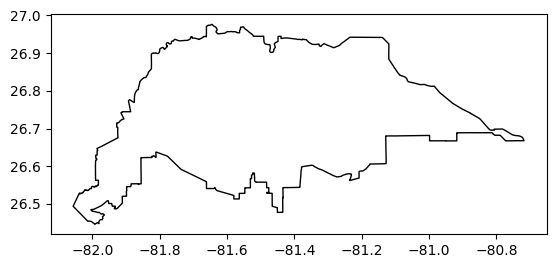

In [1]:
import geopandas as gpd

wbd_url = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703090205%27&outFields=*&f=geojson"
)

caloosa = gpd.read_file(wbd_url)

print(caloosa.crs)   # just to see what it is

caloosa.plot(edgecolor="black", facecolor="none")

## 2. Caloosahatchee River Flowline Extraction

The main stem of the Caloosahatchee River was extracted from the USGS National Hydrography Dataset (NHD) using a name-based query of the NHD Flowline (Large Scale) layer. All polyline features associated with the “Caloosahatchee” GNIS name were retrieved, providing an accurate representation of the river’s course through the watershed.

In [6]:
import geopandas as gpd
import pandas as pd
import requests
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry

# ---- SAME query logic as before ----
base_url = "https://hydro.nationalmap.gov/arcgis/rest/services/nhd/MapServer/6/query"
where = "gnis_name LIKE 'Caloosahatchee%'"  # SAME

# ---- optional: clip by your watershed extent to reduce the payload (RECOMMENDED) ----
# This does NOT change your downstream logic (still a GeoDataFrame called river),
# it just prevents pulling the entire US's matching features if the name exists elsewhere.
# If you don't want this, set USE_BBOX = False
USE_BBOX = True

geometry_params = {}
if USE_BBOX:
    # caloosa must already exist from your earlier cell
    caloosa_3857 = caloosa.to_crs("EPSG:3857")
    xmin, ymin, xmax, ymax = caloosa_3857.total_bounds
    pad = 20000  # meters padding around watershed box
    bbox = (xmin - pad, ymin - pad, xmax + pad, ymax + pad)

    geometry_params = {
        "geometry": f"{bbox[0]},{bbox[1]},{bbox[2]},{bbox[3]}",
        "geometryType": "esriGeometryEnvelope",
        "inSR": "3857",
        "spatialRel": "esriSpatialRelIntersects",
    }

# ---- requests session with retries (handles intermittent slowness) ----
session = requests.Session()
retry = Retry(
    total=6,
    backoff_factor=1.5,
    status_forcelist=[429, 500, 502, 503, 504],
    allowed_methods=["GET"],
)
session.mount("https://", HTTPAdapter(max_retries=retry))

batch_size = 250      # smaller pages -> less likely to timeout
offset = 0
all_parts = []

while True:
    params = {
        "where": where,
        "outFields": "*",              # KEEP SAME OUTPUT
        "returnGeometry": "true",
        "f": "geojson",
        "resultRecordCount": batch_size,
        "resultOffset": offset,
        **geometry_params,
    }

    # longer timeout (connect timeout, read timeout)
    resp = session.get(base_url, params=params, timeout=(15, 180))
    resp.raise_for_status()
    gj = resp.json()

    feats = gj.get("features", [])
    if not feats:
        break

    gdf_part = gpd.GeoDataFrame.from_features(feats, crs="EPSG:4326")
    all_parts.append(gdf_part)

    print(f"Fetched {len(gdf_part)} features (offset={offset})")

    if len(gdf_part) < batch_size:
        break

    offset += batch_size

# stitch into one GeoDataFrame called river (same as before)
if len(all_parts) == 0:
    river = gpd.GeoDataFrame(geometry=[], crs="EPSG:4326")
else:
    river = pd.concat(all_parts, ignore_index=True)
    river = gpd.GeoDataFrame(river, geometry="geometry", crs="EPSG:4326")

print("River CRS:", river.crs)
print("Number of features:", len(river))

Fetched 250 features (offset=0)
Fetched 18 features (offset=250)
River CRS: EPSG:4326
Number of features: 268


In [8]:
pip install contextily

Note: you may need to restart the kernel to use updated packages.


## 3. Monitoring Stations, Coordinate Transformation, and Map Generation (Caloosahatchee)

Monitoring station coordinates were compiled and converted into a geospatial dataset for inclusion on the study-area map. All spatial layers—including the watershed boundary, river flowline, and station locations—were reprojected to the Web Mercator coordinate system (EPSG:3857) to ensure compatibility with the OpenStreetMap basemap. These layers were then combined to generate a composite map of the Caloosahatchee watershed, providing a clear visualization of the basin, the river’s course, and the associated monitoring locations.

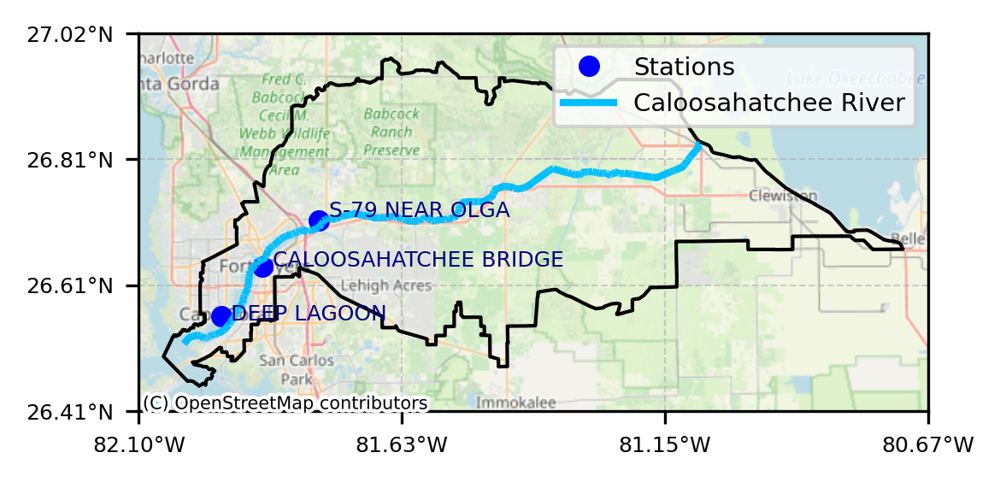

In [12]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as cx
import matplotlib.lines as mlines

from pyproj import Transformer
import matplotlib.ticker as mticker

# -----------------------------------------------------------
# 1. STATION LOCATIONS (EDIT COORDS AS NEEDED)
# -----------------------------------------------------------
stations_data = [
    {"name": "S-79 NEAR OLGA",        "lon": -81.7760, "lat": 26.7150},
    {"name": "CALOOSAHATCHEE BRIDGE", "lon": -81.8780, "lat": 26.6400},
    {"name": "DEEP LAGOON",           "lon": -81.9530, "lat": 26.5600},
]

stations = gpd.GeoDataFrame(
    stations_data,
    geometry=[Point(d["lon"], d["lat"]) for d in stations_data],
    crs="EPSG:4326"
)

# -----------------------------------------------------------
# 2. PROJECT EVERYTHING TO WEB MERCATOR FOR BASEMAP
# -----------------------------------------------------------
target_crs = "EPSG:3857"

caloosa_3857  = caloosa.to_crs(target_crs)
river_3857    = river.to_crs(target_crs)
stations_3857 = stations.to_crs(target_crs)

# -----------------------------------------------------------
# 3. START FIGURE
# -----------------------------------------------------------
fig, ax = plt.subplots(figsize=(4, 6), dpi=300)

# Watershed outline
caloosa_3857.boundary.plot(ax=ax, color="black", linewidth=1)

# River line
river_3857.plot(ax=ax, color="deepskyblue", linewidth=2)

# Stations
stations_3857.plot(ax=ax, color="blue", markersize=25)

# -----------------------------------------------------------
# 4. PER-STATION LABEL OFFSETS (for cleaner labeling)
# -----------------------------------------------------------
offsets = {
    "S-79 NEAR OLGA":        ( 2000,  700),
    "CALOOSAHATCHEE BRIDGE": ( 2000,    0),
    "DEEP LAGOON":           ( 2000, -800),
}

for x, y, label in zip(
        stations_3857.geometry.x,
        stations_3857.geometry.y,
        stations_3857["name"]):
    
    dx, dy = offsets.get(label, (500, 500))
    
    ax.text(
        x + dx,
        y + dy,
        label,
        fontsize=6,
        color="navy",
    )

# -----------------------------------------------------------
# 5. BASEMAP + EXTENT + LEGEND
# -----------------------------------------------------------
xmin, ymin, xmax, ymax = caloosa_3857.total_bounds
pad = 5000   # meters of padding around bounding box

ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# Add OpenStreetMap basemap
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=target_crs,
    alpha=0.8
)
for txt in ax.texts:
    if "OpenStreetMap" in txt.get_text():
        txt.set_fontsize(5)   # try 4–6 depending on taste

# -----------------------------------------------------------
# 5A. LAT/LON GRIDLINES + DEGREE LABELS (map is in EPSG:3857)
# -----------------------------------------------------------
to_lonlat = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

# keep it clean for a small figure
n_lines = 4

x0, x1 = ax.get_xlim()
y0, y1 = ax.get_ylim()

xticks = [x0 + i*(x1-x0)/(n_lines-1) for i in range(n_lines)]
yticks = [y0 + i*(y1-y0)/(n_lines-1) for i in range(n_lines)]

ax.set_xticks(xticks)
ax.set_yticks(yticks)

def fmt_lon(x, pos=None):
    lon, lat = to_lonlat.transform(x, (y0 + y1) / 2)
    return f"{abs(lon):.2f}°{'W' if lon < 0 else 'E'}"

def fmt_lat(y, pos=None):
    lon, lat = to_lonlat.transform((x0 + x1) / 2, y)
    return f"{abs(lat):.2f}°{'S' if lat < 0 else 'N'}"

ax.xaxis.set_major_formatter(mticker.FuncFormatter(fmt_lon))
ax.yaxis.set_major_formatter(mticker.FuncFormatter(fmt_lat))

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.6)
ax.tick_params(labelsize=6)

# -----------------------------------------------------------
# Legend handles
# -----------------------------------------------------------
station_handle = mlines.Line2D(
    [], [], color="blue", marker="o", linestyle="None",
    markersize=5, label="Stations"
)
river_handle = mlines.Line2D(
    [], [], color="deepskyblue", linewidth=2,
    label="Caloosahatchee River"
)

ax.legend(handles=[station_handle, river_handle],
          loc="upper right", fontsize=7, frameon=True)

plt.tight_layout()

# -----------------------------------------------------------
# 6. SAVE HIGH-RES EXPORT
# -----------------------------------------------------------
plt.savefig("caloosahatchee_watershed_map.png", dpi=600, bbox_inches="tight")
plt.savefig(
    r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## 4. Peace River Watershed Boundary Extraction

EPSG:4326


<Axes: >

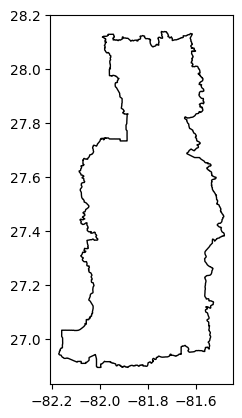

In [13]:
import geopandas as gpd

# Peace River HUC-8 from USGS WBD
wbd_url_peace = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703100101%27&outFields=*&f=geojson"
)

peace_ws = gpd.read_file(wbd_url_peace)

print(peace_ws.crs)
peace_ws.plot(edgecolor="black", facecolor="none")


## 5. Peace River Flowline From NHD

Peace WS CRS: EPSG:4326
Fetched 195 features (offset=0)
Peace River flowlines CRS: EPSG:4326
Raw flowline features: 195
Clipped flowline features: 195


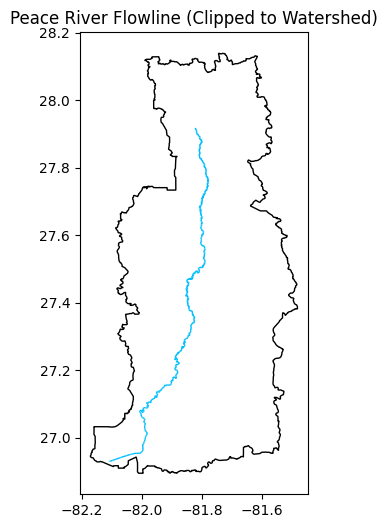

In [15]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry

# ---------------------------------------------------------------------
# 1. Peace River watershed boundary (HUC-8: 03100101) from USGS WBD
# ---------------------------------------------------------------------
wbd_url_peace = (
    "https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/4/"
    "query?where=HUC8%3D%2703100101%27&outFields=*&f=geojson"
)

peace_ws = gpd.read_file(wbd_url_peace)
print("Peace WS CRS:", peace_ws.crs)

# ---------------------------------------------------------------------
# 2. Peace River flowlines from NHD (Layer 6) - robust fetch (avoids 504)
# ---------------------------------------------------------------------
base_url = "https://hydro.nationalmap.gov/arcgis/rest/services/nhd/MapServer/6/query"
where = "gnis_name LIKE 'Peace River%'"

# Use watershed bbox (in 3857) to reduce payload + improve reliability
peace_ws_3857 = peace_ws.to_crs("EPSG:3857")
xmin, ymin, xmax, ymax = peace_ws_3857.total_bounds
pad = 30000  # meters padding
bbox = (xmin - pad, ymin - pad, xmax + pad, ymax + pad)

geometry_params = {
    "geometry": f"{bbox[0]},{bbox[1]},{bbox[2]},{bbox[3]}",
    "geometryType": "esriGeometryEnvelope",
    "inSR": "3857",
    "spatialRel": "esriSpatialRelIntersects",
}

# Requests session with retries/backoff
session = requests.Session()
retry = Retry(
    total=6,
    backoff_factor=1.5,
    status_forcelist=[429, 500, 502, 503, 504],
    allowed_methods=["GET"],
)
session.mount("https://", HTTPAdapter(max_retries=retry))

batch_size = 250
offset = 0
parts = []

while True:
    params = {
        "where": where,
        "outFields": "*",               # KEEP SAME OUTPUT STRUCTURE
        "returnGeometry": "true",
        "f": "geojson",
        "resultRecordCount": batch_size,
        "resultOffset": offset,
        **geometry_params,
    }

    resp = session.get(base_url, params=params, timeout=(15, 180))
    resp.raise_for_status()
    gj = resp.json()

    feats = gj.get("features", [])
    if not feats:
        break

    gdf_part = gpd.GeoDataFrame.from_features(feats, crs="EPSG:4326")
    parts.append(gdf_part)
    print(f"Fetched {len(gdf_part)} features (offset={offset})")

    if len(gdf_part) < batch_size:
        break

    offset += batch_size

if len(parts) == 0:
    peace_river = gpd.GeoDataFrame(geometry=[], crs="EPSG:4326")
else:
    peace_river = pd.concat(parts, ignore_index=True)
    peace_river = gpd.GeoDataFrame(peace_river, geometry="geometry", crs="EPSG:4326")

print("Peace River flowlines CRS:", peace_river.crs)
print("Raw flowline features:", len(peace_river))

# ---------------------------------------------------------------------
# 3. Clip flowlines to the watershed to remove stray segments
# ---------------------------------------------------------------------
peace_ws = peace_ws.to_crs(peace_river.crs)
peace_river_clip = gpd.overlay(peace_river, peace_ws, how="intersection")
print("Clipped flowline features:", len(peace_river_clip))

# ---------------------------------------------------------------------
# 4. Plot result
# ---------------------------------------------------------------------
ax = peace_ws.plot(edgecolor="black", facecolor="none", figsize=(4, 6))
peace_river_clip.plot(ax=ax, color="deepskyblue", linewidth=1)

plt.title("Peace River Flowline (Clipped to Watershed)")
plt.show()

## 6. Monitoring Stations, Coordinate Transformation, and Map Generation (Peace River)

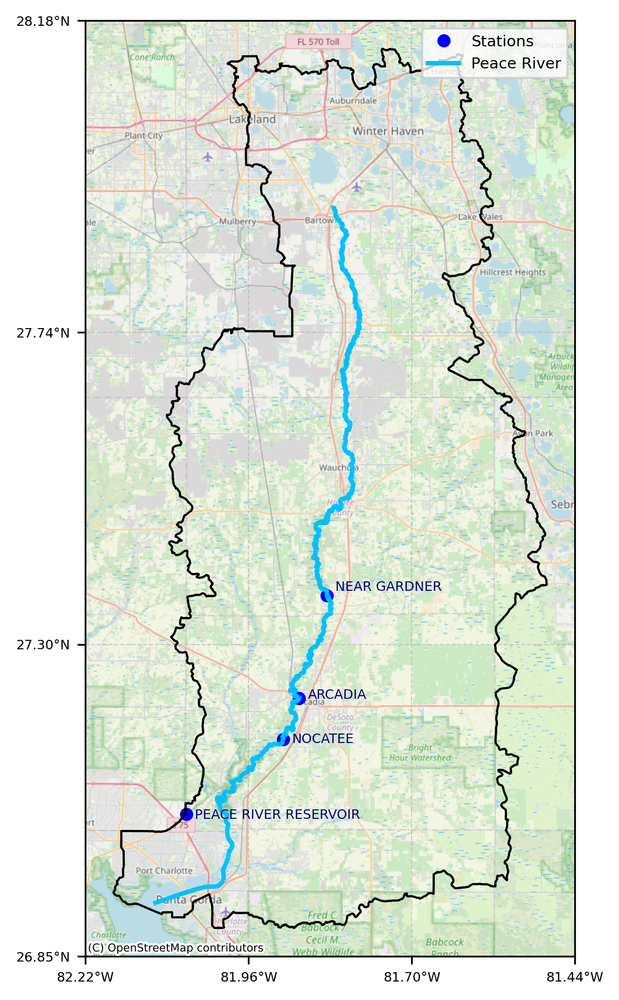

In [40]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as cx
import matplotlib.lines as mlines

from pyproj import Transformer
import matplotlib.ticker as mticker

# -----------------------------------------------------------
# 1. PEACE RIVER STATION LOCATIONS (EDIT COORDS AS NEEDED)
# -----------------------------------------------------------
stations_peace_data = [
    # {"name": "PEACE RIVER RESERVOIR", "lon": -82.056225, "lat": 27.056806},  # keep if you want it
    {"name": "NEAR GARDNER",          "lon": -81.8320229,  "lat": 27.3669874},
    {"name": "ARCADIA",               "lon": -81.8761946,  "lat": 27.22088245},
    {"name": "NOCATEE",               "lon": -81.90175090, "lat": 27.16282928},
    {"name": "PEACE RIVER RESERVOIR", "lon": -82.056225,   "lat": 27.056806},
]

stations_peace = gpd.GeoDataFrame(
    stations_peace_data,
    geometry=[Point(d["lon"], d["lat"]) for d in stations_peace_data],
    crs="EPSG:4326"
)

# -----------------------------------------------------------
# 2. REPROJECT EVERYTHING TO WEB MERCATOR FOR BASEMAP
# -----------------------------------------------------------
target_crs = "EPSG:3857"

peace_ws_3857       = peace_ws.to_crs(target_crs)
peace_river_3857    = peace_river_clip.to_crs(target_crs)
stations_peace_3857 = stations_peace.to_crs(target_crs)

# -----------------------------------------------------------
# 3. CREATE FIGURE (TALL LIKE YOUR ADVISOR'S)
# -----------------------------------------------------------
fig, ax = plt.subplots(figsize=(4, 8), dpi=300)

# Watershed outline
peace_ws_3857.boundary.plot(ax=ax, color="black", linewidth=1)

# River line
peace_river_3857.plot(ax=ax, color="deepskyblue", linewidth=2)

# Stations
stations_peace_3857.plot(ax=ax, color="blue", markersize=25)

# -----------------------------------------------------------
# 4. LABELS WITH PER-STATION OFFSETS
# -----------------------------------------------------------
offsets_peace = {
    "NEAR GARDNER":          (1500,  800),
    "ARCADIA":               (1500,    0),
    "NOCATEE":               (1500, -600),
    "PEACE RIVER RESERVOIR": (1500, -800),
}

for x, y, label in zip(
        stations_peace_3857.geometry.x,
        stations_peace_3857.geometry.y,
        stations_peace_3857["name"]):

    dx, dy = offsets_peace.get(label, (500, 500))
    ax.text(x + dx, y + dy, label, fontsize=6, color="navy")

# -----------------------------------------------------------
# 5. EXTENT + BASEMAP
# -----------------------------------------------------------
xmin, ymin, xmax, ymax = peace_ws_3857.total_bounds
pad = 5000
ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# OSM basemap
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=target_crs,
    alpha=0.8
)

# -----------------------------------------------------------
# 5A. SMALLER OSM ATTRIBUTION FONT
# -----------------------------------------------------------
for txt in ax.texts:
    if "OpenStreetMap" in txt.get_text():
        txt.set_fontsize(5)  # match what worked for Caloosahatchee

# -----------------------------------------------------------
# 5B. LAT/LON GRIDLINES + DEGREE LABELS (map is in EPSG:3857)
# -----------------------------------------------------------
to_lonlat = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

n_lines = 4  # keep it clean for a small figure

x0, x1 = ax.get_xlim()
y0, y1 = ax.get_ylim()

xticks = [x0 + i*(x1-x0)/(n_lines-1) for i in range(n_lines)]
yticks = [y0 + i*(y1-y0)/(n_lines-1) for i in range(n_lines)]

ax.set_xticks(xticks)
ax.set_yticks(yticks)

def fmt_lon(x, pos=None):
    lon, lat = to_lonlat.transform(x, (y0 + y1) / 2)
    return f"{abs(lon):.2f}°{'W' if lon < 0 else 'E'}"

def fmt_lat(y, pos=None):
    lon, lat = to_lonlat.transform((x0 + x1) / 2, y)
    return f"{abs(lat):.2f}°{'S' if lat < 0 else 'N'}"

ax.xaxis.set_major_formatter(mticker.FuncFormatter(fmt_lon))
ax.yaxis.set_major_formatter(mticker.FuncFormatter(fmt_lat))

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.6)
ax.tick_params(labelsize=6)

# -----------------------------------------------------------
# 5C. LEGEND
# -----------------------------------------------------------
station_handle = mlines.Line2D(
    [], [], color="blue", marker="o", linestyle="None",
    markersize=5, label="Stations"
)
river_handle = mlines.Line2D(
    [], [], color="deepskyblue", linewidth=2,
    label="Peace River"
)

ax.legend(handles=[station_handle, river_handle],
          loc="upper right", fontsize=7, frameon=True)

# -----------------------------------------------------------
# 6. SAVE HIGH-RES IMAGE TO YOUR FOLDER
#    (Avoid bbox_inches="tight" at 600 DPI with basemaps to prevent MemoryError)
# -----------------------------------------------------------
fig.savefig(
    r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png",
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.09   # key line: trims top/bottom white space
)

plt.show()

## 7. Overlay Study Areas on Map of Florida

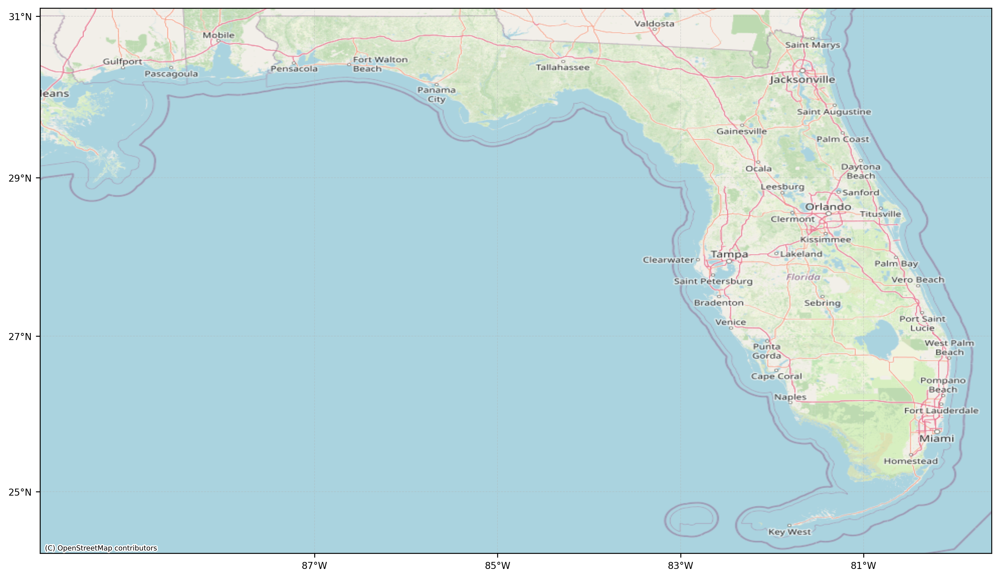

In [41]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from shapely.geometry import box
from pyproj import Transformer
import matplotlib.ticker as mticker

# -----------------------------------------------------------
# 1) FLORIDA MAP EXTENT (LON/LAT)
# -----------------------------------------------------------
minlon, minlat, maxlon, maxlat = (-90.0, 24.2, -79.6, 31.1)

fl_poly_ll = box(minlon, minlat, maxlon, maxlat)
xmin, ymin, xmax, ymax = (
    gpd.GeoSeries([fl_poly_ll], crs="EPSG:4326")
    .to_crs("EPSG:3857")
    .total_bounds
)

# -----------------------------------------------------------
# 2) PLOT BASEMAP
# -----------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 7), dpi=300)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs="EPSG:3857",
    alpha=1.0
)

# -----------------------------------------------------------
# 3) LAT / LON GRIDLINES (SUBTLE, CONTEXT ONLY)
# -----------------------------------------------------------
to_lonlat = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

# Choose sparse, clean ticks
lon_ticks = [-87, -85, -83, -81]
lat_ticks = [25, 27, 29, 31]

# Convert to Web Mercator
x_ticks = [Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
           .transform(lon, minlat)[0] for lon in lon_ticks]
y_ticks = [Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
           .transform(minlon, lat)[1] for lat in lat_ticks]

ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)

def fmt_lon(x, pos=None):
    lon, _ = to_lonlat.transform(x, (ymin + ymax) / 2)
    return f"{abs(lon):.0f}°W"

def fmt_lat(y, pos=None):
    _, lat = to_lonlat.transform((xmin + xmax) / 2, y)
    return f"{lat:.0f}°N"

ax.xaxis.set_major_formatter(mticker.FuncFormatter(fmt_lon))
ax.yaxis.set_major_formatter(mticker.FuncFormatter(fmt_lat))

ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.tick_params(labelsize=8)

# -----------------------------------------------------------
# 4) OSM ATTRIBUTION SIZE (UNCHANGED)
# -----------------------------------------------------------
for t in ax.texts:
    if "OpenStreetMap" in t.get_text():
        t.set_fontsize(6)

plt.tight_layout()
fig.savefig(
    r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Florida_Map.png",
    dpi=600
)
plt.show()

## 7. Generate Side by Side Graphic of Watersheds

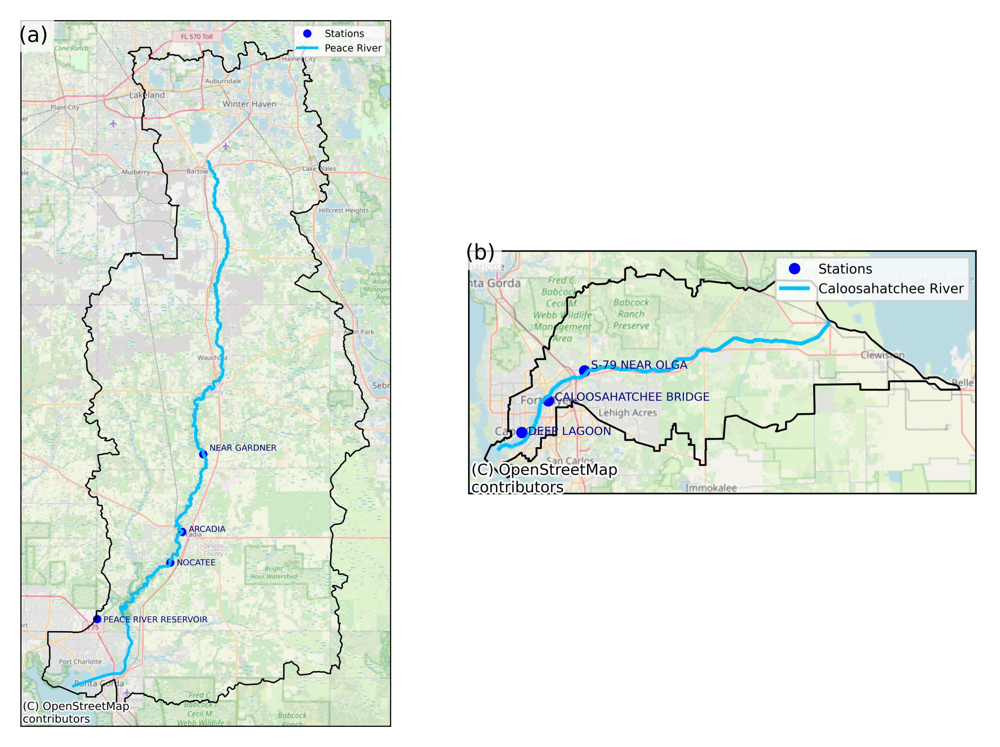

In [30]:
from PIL import Image
import matplotlib.pyplot as plt

# --- EDIT THESE PATHS to your actual saved map files ---
peace_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png"
caloosa_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png"

# Output file
out_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa.png"

# Load images
img_peace = Image.open(peace_png)
img_caloosa = Image.open(caloosa_png)

# Make them the same height (keeps proportions clean)
target_h = max(img_peace.height, img_caloosa.height)

img_peace = img_peace.resize(
    (int(img_peace.width * target_h / img_peace.height), target_h)
)

img_caloosa = img_caloosa.resize(
    (int(img_caloosa.width * target_h / img_caloosa.height), target_h)
)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(10, 7), dpi=300)

axes[0].imshow(img_peace)
axes[0].axis("off")
axes[0].text(
    0.02, 0.98, "(a)",
    transform=axes[0].transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.75)
)

axes[1].imshow(img_caloosa)
axes[1].axis("off")
axes[1].text(
    0.02, 0.98, "(b)",
    transform=axes[1].transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.75)
)

plt.tight_layout()

# Save combined figure
plt.savefig(out_png, dpi=600, bbox_inches="tight")
plt.show()

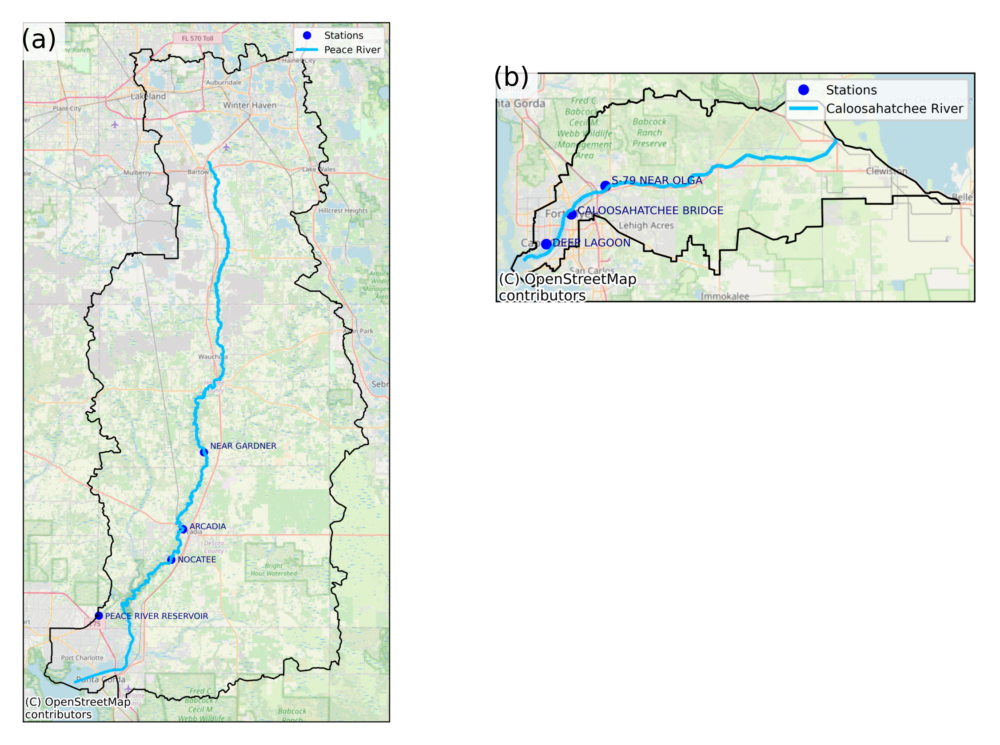

Saved publication figure to:
C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa_PUBLICATION.png


In [27]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# -----------------------------------------------------------
# INPUT FILE PATHS (EDIT IF NEEDED)
# -----------------------------------------------------------
peace_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Peace River Watershed Graphics\peace_river_watershed_map.png"
caloosa_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Caloosahatchee watershed Graphics\caloosahatchee_watershed_map.png"

# OUTPUT FILE
out_png = r"C:\Users\mkduu\OneDrive\Documents\FGCU docs\Summer 25 Red Tide Project\Graphics\Figure_1_Study_Area_Peace_Caloosa_PUBLICATION.png"

# -----------------------------------------------------------
# LOAD IMAGES (CONVERT RGBA → RGB TO AVOID PIL ERROR)
# -----------------------------------------------------------
imgA = Image.open(peace_png).convert("RGB")
imgB = Image.open(caloosa_png).convert("RGB")

# OPTIONAL: autocontrast to tighten whites (safe now)
imgA = ImageOps.autocontrast(imgA)
imgB = ImageOps.autocontrast(imgB)

# -----------------------------------------------------------
# RESIZE TO MATCH WIDTHS (MAKES PANELS FEEL BALANCED)
# -----------------------------------------------------------
target_width = 1400  # adjust if desired

imgA = imgA.resize(
    (target_width, int(imgA.height * target_width / imgA.width))
)
imgB = imgB.resize(
    (target_width, int(imgB.height * target_width / imgB.width))
)

# -----------------------------------------------------------
# CREATE GRID LAYOUT (PUBLICATION STYLE)
# -----------------------------------------------------------
fig = plt.figure(figsize=(10, 7), dpi=300)

gs = gridspec.GridSpec(
    2, 2,
    width_ratios=[1.0, 1.0],
    height_ratios=[1.0, 1.0],
    wspace=0.05,
    hspace=0.05
)

# (a) Peace River — left column, full height
axA = fig.add_subplot(gs[:, 0])
axA.imshow(imgA)
axA.axis("off")
axA.text(
    0.02, 0.98, "(a)",
    transform=axA.transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.8)
)

# (b) Caloosahatchee — upper right
axB = fig.add_subplot(gs[0, 1])
axB.imshow(imgB)
axB.axis("off")
axB.text(
    0.02, 0.98, "(b)",
    transform=axB.transAxes,
    ha="left", va="top",
    fontsize=14,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.8)
)

# Bottom-right intentionally blank (clean composition)
ax_blank = fig.add_subplot(gs[1, 1])
ax_blank.axis("off")

# -----------------------------------------------------------
# SAVE HIGH-RES FIGURE
# -----------------------------------------------------------
plt.savefig(out_png, dpi=600, bbox_inches="tight")
plt.show()

print("Saved publication figure to:")
print(out_png)